In [114]:
import tqdm

In [115]:
names = open('names.txt','r').read().splitlines()

In [116]:
len(names)

33198

In [117]:
names = list(map(str.lower,names))

### MODEL 1: Bigram

#### STEP 1: Make a frequency map for all combinations of letters that exist in the given names

In [118]:
bigram_dict = {}
for w in names:
    tok_list = ['<S>'] + list(w) + ['<E>']
    for ch1,ch2 in zip(tok_list,tok_list[1:]):
        key = (ch1,ch2)
        bigram_dict[key] = bigram_dict.get(key,0) + 1 # get the value and increment, if it doesn't exist make it 0 + 1


In [119]:
# my_dict = {'Hello':'World',"New":"Girl"}
# list(my_dict.items())

Sorts on the basis of the frequency

In [120]:
sorted(bigram_dict.items(),key = lambda kv: -kv[1])

[(('a', '<E>'), 6944),
 (('n', '<E>'), 6871),
 (('a', 'n'), 5756),
 (('<S>', 'a'), 4617),
 (('e', '<E>'), 3993),
 (('a', 'r'), 3427),
 (('e', 'l'), 3253),
 (('r', 'i'), 3129),
 (('n', 'a'), 3074),
 (('<S>', 'k'), 3022),
 (('l', 'e'), 2932),
 (('e', 'n'), 2709),
 (('m', 'a'), 2693),
 (('i', '<E>'), 2664),
 (('l', 'a'), 2650),
 (('<S>', 'm'), 2614),
 (('a', 'l'), 2601),
 (('r', 'a'), 2547),
 (('h', '<E>'), 2530),
 (('l', 'i'), 2507),
 (('h', 'a'), 2484),
 (('<S>', 'j'), 2452),
 (('i', 'a'), 2450),
 (('o', 'n'), 2429),
 (('a', 'h'), 2360),
 (('<S>', 's'), 2313),
 (('y', 'a'), 2254),
 (('i', 'n'), 2191),
 (('a', 'y'), 2091),
 (('y', '<E>'), 2041),
 (('e', 'r'), 1981),
 (('n', 'n'), 1915),
 (('k', 'a'), 1840),
 (('y', 'n'), 1826),
 (('n', 'i'), 1818),
 (('<S>', 'd'), 1742),
 (('r', 'e'), 1732),
 (('<S>', 'r'), 1720),
 (('a', 'm'), 1718),
 (('a', 'i'), 1682),
 (('s', 'h'), 1664),
 (('i', 'e'), 1653),
 (('l', 'y'), 1591),
 (('<S>', 'l'), 1582),
 (('<S>', 'c'), 1555),
 (('<S>', 'e'), 1536),
 (

**Now, we to make the sum of these characters easier, we can use torch array instead of the python dictionary**

In [121]:
import torch

Now, we will initiate an array of zeroes in torch to fill with our frequencies 

In [122]:
N = torch.zeros((27,27),dtype = torch.int32)

In [123]:
# Apparently, the set function works even on chars of a string to give us unique characters
chars = sorted(set(''.join(names)))
stoi = {} # a mapping from strings to integers
for i, char in enumerate(chars):
    stoi[char] = i+1
stoi['.'] = 0 # . is the starting and stopping token here


In [124]:
stoi

{'a': 1,
 'b': 2,
 'c': 3,
 'd': 4,
 'e': 5,
 'f': 6,
 'g': 7,
 'h': 8,
 'i': 9,
 'j': 10,
 'k': 11,
 'l': 12,
 'm': 13,
 'n': 14,
 'o': 15,
 'p': 16,
 'q': 17,
 'r': 18,
 's': 19,
 't': 20,
 'u': 21,
 'v': 22,
 'w': 23,
 'x': 24,
 'y': 25,
 'z': 26,
 '.': 0}

Now, we can use our torch array as follows

In [125]:
for w in names:
    w_list = ['.'] + list(w) + ['.'] # each name should start and stop with this start/stop token
    for ch1,ch2 in zip(w_list,w_list[1:]):
        # we first get the int value of our letters
        ch1_int = stoi[ch1]
        ch2_int = stoi[ch2]
        # print(f"{ch1=} {ch2=} {ch1_int=} {ch2_int=}")
        N[ch1_int,ch2_int] += 1 # This is a 2D coordinate in the torch array

ch1='.' ch2='e' ch1_int=0 ch2_int=5
ch1='e' ch2='m' ch1_int=5 ch2_int=13
ch1='m' ch2='m' ch1_int=13 ch2_int=13
ch1='m' ch2='a' ch1_int=13 ch2_int=1
ch1='a' ch2='.' ch1_int=1 ch2_int=0
ch1='.' ch2='o' ch1_int=0 ch2_int=15
ch1='o' ch2='l' ch1_int=15 ch2_int=12
ch1='l' ch2='i' ch1_int=12 ch2_int=9
ch1='i' ch2='v' ch1_int=9 ch2_int=22
ch1='v' ch2='i' ch1_int=22 ch2_int=9
ch1='i' ch2='a' ch1_int=9 ch2_int=1
ch1='a' ch2='.' ch1_int=1 ch2_int=0
ch1='.' ch2='a' ch1_int=0 ch2_int=1
ch1='a' ch2='v' ch1_int=1 ch2_int=22
ch1='v' ch2='a' ch1_int=22 ch2_int=1
ch1='a' ch2='.' ch1_int=1 ch2_int=0
ch1='.' ch2='i' ch1_int=0 ch2_int=9
ch1='i' ch2='s' ch1_int=9 ch2_int=19
ch1='s' ch2='a' ch1_int=19 ch2_int=1
ch1='a' ch2='b' ch1_int=1 ch2_int=2
ch1='b' ch2='e' ch1_int=2 ch2_int=5
ch1='e' ch2='l' ch1_int=5 ch2_int=12
ch1='l' ch2='l' ch1_int=12 ch2_int=12
ch1='l' ch2='a' ch1_int=12 ch2_int=1
ch1='a' ch2='.' ch1_int=1 ch2_int=0
ch1='.' ch2='s' ch1_int=0 ch2_int=19
ch1='s' ch2='o' ch1_int=19 ch2_int=15
ch1='o'

#### Now we will try to visualize this array

In [126]:
import matplotlib.pyplot as plt
%matplotlib inline

We are just flipping our mapping dictionary for ease of use in the next cell

In [127]:
itos = {j:i for i,j in stoi.items()}


(-0.5, 26.5, 26.5, -0.5)

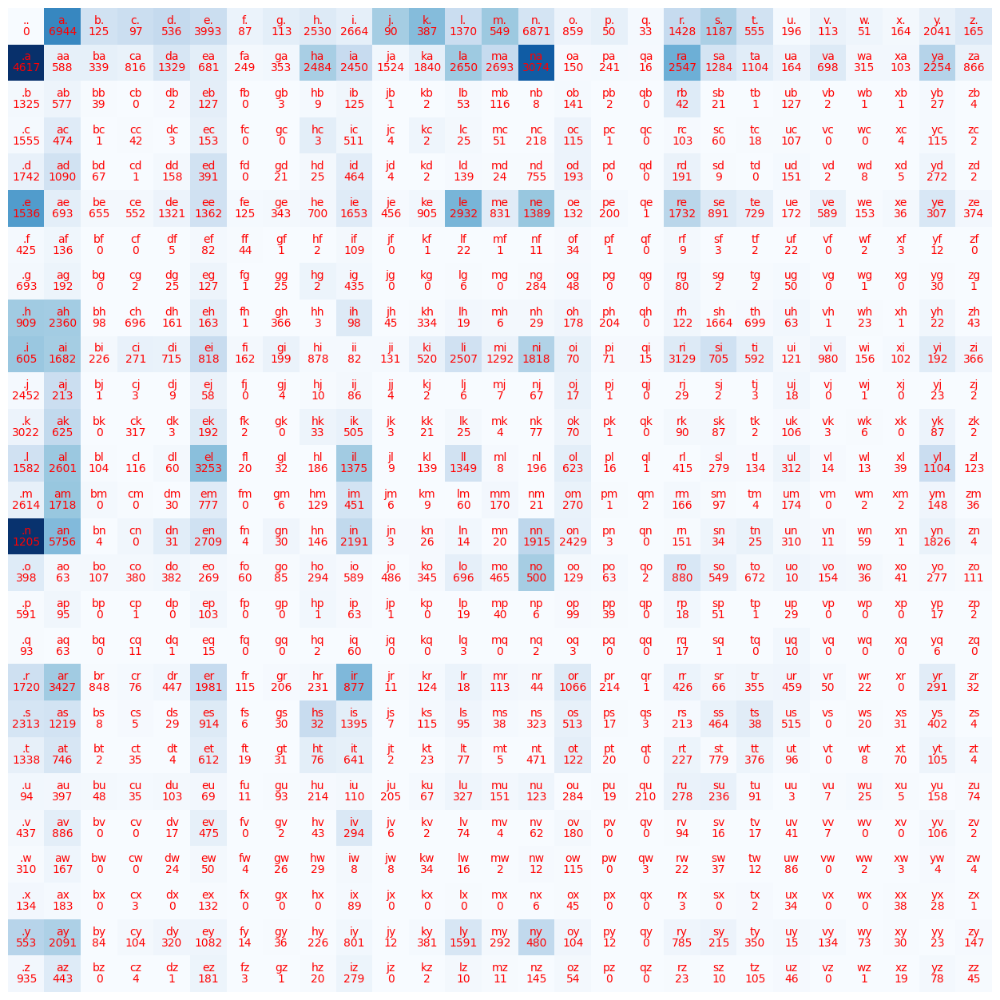

In [128]:
plt.figure(figsize=(16,16))
plt.imshow(N,cmap = 'Blues')

for i in range(27):
    for j in range(27):
        chstr = itos[i] + itos[j]
        plt.text(i,j,chstr,ha="center",va="bottom",color = "red")
        plt.text(i,j,N[i,j].item(),ha="center",va="top",color = "red")

plt.axis('off')

#### STEP 2: Calculating probabilities

We can get a whole row of the count map that we have in the following way

In [129]:
N[0]

tensor([   0, 4617, 1325, 1555, 1742, 1536,  425,  693,  909,  605, 2452, 3022,
        1582, 2614, 1205,  398,  591,   93, 1720, 2313, 1338,   94,  437,  310,
         134,  553,  935], dtype=torch.int32)

Now, we just have to convert these counts into probabilities
This operation is performed row wise because, we know the prev char and want the next one and so we calculate probabilities of all possible next tokens given the current one.

In [130]:
p = N[0].float()
p = N[0]/sum(N[0])
p

tensor([0.0000, 0.1391, 0.0399, 0.0468, 0.0525, 0.0463, 0.0128, 0.0209, 0.0274,
        0.0182, 0.0739, 0.0910, 0.0477, 0.0787, 0.0363, 0.0120, 0.0178, 0.0028,
        0.0518, 0.0697, 0.0403, 0.0028, 0.0132, 0.0093, 0.0040, 0.0167, 0.0282])

#### STEP 3: Generating names

First, we get a torch multinomial generator which generates a number from the given list according to its probability

In [131]:
P = N.float()

[Pytorch documentation for torch.sum](https://pytorch.org/docs/stable/generated/torch.sum.html)   
[Pytorch docs for  Broadcasting rules!!!](https://pytorch.org/docs/stable/notes/broadcasting.html)

In [132]:
P /= P.sum(dim=1,keepdim=True)
# If we don't make keepdim=True, the array loses a dimension i.e. [27,27] --> [27,], but, we want [27,1]

In [133]:
f = open("mlp_basic_out.txt", "a")

In [134]:
g = torch.Generator().manual_seed(2147483647)

for i in range(1000):
    out = []

    idx = 0
    while True:
        p = P[idx]
        # print(p)
        idx = torch.multinomial(p,num_samples=1,replacement=True,generator=g).item()
        if idx == 0:
            break
        out.append(itos[idx])
    new_name = ''.join(out)
    f.write(new_name+'\n')
    print(new_name)
        


junide
janasah
p
cony
a
nn
kohin
tolian
juee
ksahnaauranilevias
dedainrwieta
ssonielylarte
faveumerifontume
phynsh
jaruani
core
yaenon
ka
jabdinerimikimaynin
anaasn
ssorionsush
dgossmitan
il
se
pann
that
janreli
isa
dyn
rijelumemahaunayaleva
cararr
jenh
anarta
maly
abely
a
i
lavadoni
themielyawat
f
modam
tavilitikiesaloeverin
n
e
kalbrenelah
anen
ch
k
jan
odridrdenanialilpergha
tezralelia
vymalelvan
hiahimahacelahmimi
rasabyoni
pe
aliaierenn
jayannda
r
ceremankesorannje
sanoman
kyn
deriganannidab
vi
on
bahatelyti
keus
dasa
en
ton
codarerlasppahlealilondesl
fanna
m
m
shana
ve
h
moge
jaresynivien
usien
ja
jenam
anth
marafrlanlylialeyngarirriyli
msoireviayitarkannja
neniadahulyl
cichatavryaelesh
rla
s
jau
brialieri
kha
nerarhihisisarilakamorvann
akela
az
arileri
chaiadayra
ferlodouseyton
za
sabran
han
ke
etamete
conakin
lalastan
tisonanisemyn
lewes
an
kadarekan
ljagezie
fian
kichaylula
jusei
dyn
hmay
semiosienamou
m
n
kadicooror
amiqurimiadeyn
keika
viyn
tax
mande
ttolausali
mhaheeekaza
k

### STEP 4: Loss function
We need a way of determining the quality of the model. To do this we can multiply the probabilities of all the bigram pairs that we have in our dataset and this should be as close to 1.0 as possible  
To do this, we can use the following metrics

****Likelihood**** - Multiplication of all probabilities in our dataset  
****Log Likelihood**** - Sum of log of all the probabilities of our dataset. This has the advantage of having a scale of -inf to 0    

****We need to maximize the above 2 metrics and that is not inline with how loss works, so we do a -ve log likelihood and going one step further, we get an avg of all the -ve log likelihoods for normalization.****


In [135]:
len([list(n) for n in names])

33198

In [136]:
log_likelihood = 0.0
likelihood = 1.0
avg_log_likelihood = 0.0
neg_log_likelihood = 1.0
n = 0

for name in list(names):
    w = ['.']+list(name)+['.']
    for i,j in zip(w,w[1:]):
        idx_i = stoi[i]
        idx_j = stoi[j]
        prob = P[idx_i,idx_j]
        log_prob = torch.log(prob)
        log_likelihood += log_prob
        n+=1
        # print(f'{n} : {i},{j}  {likelihood=}  {log_likelihood=}  {neg_log_likelihood=}')
neg_log_likelihood = -log_likelihood
avg_log_likelihood = neg_log_likelihood/n
print(f'{neg_log_likelihood=}\n{avg_log_likelihood=}')
    

neg_log_likelihood=tensor(582777.4375)
avg_log_likelihood=tensor(2.4600)


In [137]:
P = (N+1).float()
P /= P.sum(dim=1,keepdim=True)
g = torch.Generator().manual_seed(2147483647)

for i in range(1000):
    out = []

    idx = 0
    while True:
        p = P[idx]
        idx = torch.multinomial(p,num_samples=1,replacement=True,generator=g).item()
        if idx == 0:
            break
        out.append(itos[idx])
    print(''.join(out))

junide
janasah
p
cony
a
nn
kohin
tolian
juee
ksahnaauranilevias
dedainrwieta
ssonielylarte
faveumerifontume
phynsh
jaruani
core
yaenon
ka
jabdinerimikim
ynin
anaasn
ssorionsush
dgossmitan
il
se
pann
that
janreli
isa
dyn
rijelumemahaunayaleva
cararr
jenh
anarta
maly
abely
a
i
lavadoni
themielyawat
f
modam
tavilitikiesaloeverin
n
e
kalbrenelah
anen
ch
k
jan
odridrdenanialilpergha
tezralelia
vymalelvan
hiahimahacelahmimi
rasabyoni
pe
aliaierenn
jayannda
r
ceremankesorannje
sanoman
kyn
deriganannidab
vi
on
bahatelyti
keus
dasa
en
ton
codarerlasppahlealilondesl
fanna
m
m
shana
ve
h
moge
jaresynivien
usien
ja
jenam
anth
marafrlanlylialeyngnoruriyli
msoireviayitarkannja
neniadahulyl
cichatavryaelesh
rla
s
jau
brialieri
kha
nerarhihisisarilakamorvann
akela
az
arileri
chaiadayra
fbalodouseyton
za
sabran
han
ke
etamete
conakin
lalastan
tisonanisemyn
lewes
an
kadarekan
ljagezie
fian
kichaylula
jvy
b
dyn
hmay
semiosienamou
m
n
kadicooror
amiqurimiadeyn
keika
viyn
tax
mande
ttolausali
mhaheeekaza
k

### ****STEP 5****: Model smoothing
We could have some counts in our count array which are zero which result in -inf probabilities so, we will add 1 to all our counts to smoothen the model.  
(This can be done at any value and not just 1)

In [138]:
P = N.float()
P/= P.sum(1, keepdim = True)
name_tested = list('andrej')

log_likelihood = 0

w = ['.']+name_tested+['.']
for i,j in zip(w,w[1:]):
    idx_i = stoi[i]
    idx_j = stoi[j]
    prob = P[idx_i,idx_j]
    log_likelihood += torch.log(prob)
    print(f'{i},{j}  prob = {prob.item()}')
print(f'{log_likelihood=}')

.,a  prob = 0.1390746384859085
a,n  prob = 0.16246578097343445
n,d  prob = 0.03993229940533638
d,r  prob = 0.0782015398144722
r,e  prob = 0.13101361691951752
e,j  prob = 0.0027926235925406218
j,.  prob = 0.02982107363641262
log_likelihood=tensor(-20.9848)


This is an easy fix, to smoothen this model out, we will just add 1 to all of the counts in our matrix

In [139]:
P = (N+1).float() # adds 1 to everything
P/= P.sum(1, keepdim = True)
name_tested = list('shlok')

log_likelihood = 0

w = ['.']+name_tested+['.']
for i,j in zip(w,w[1:]):
    idx_i = stoi[i]
    idx_j = stoi[j]
    prob = P[idx_i,idx_j]
    log_likelihood += torch.log(prob)
    print(f'{i},{j}  {prob=}')
print(f'{log_likelihood=}')

.,s  prob=tensor(0.0696)
s,h  prob=tensor(0.1897)
h,l  prob=tensor(0.0224)
l,o  prob=tensor(0.0493)
o,k  prob=tensor(0.0088)
k,.  prob=tensor(0.0731)
log_likelihood=tensor(-18.4825)


## MODEL 2: Multi-layer perceptron
Instead of just directly using the probabilities generated by our count matrix, we can instead use a neural network which will generate a probability matrix dynamically.

#### STEP 1: Creating the dataset

In [152]:
xs = []
ys = []

for w in names[:1]: # we are only taking the first name for demonstration
    w_list = ['.']+list(w)+['.']
    for i, j in zip(w_list,w_list[1:]):
        idx_i = stoi[i]
        idx_j = stoi[j]
        print(f'{i},{j}')
        xs.append(idx_i)
        ys.append(idx_j)


# There is also a class called torch.Tensor which returns a float tensor on construction, please refer to 
xs = torch.tensor(xs)
ys = torch.tensor(ys)


.,e
e,m
m,m
m,a
a,.


We cannot pass out xs values directly to the NN. We need to perform one hot encoding.

In [153]:
from torch.nn.functional import one_hot

This will make those bits one which are present in the input class

xs=tensor([ 0,  5, 13, 13,  1])
 x_enc=tensor([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.]])


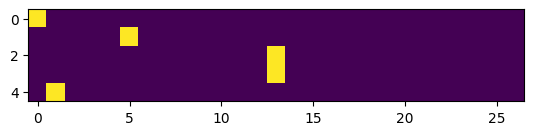

In [154]:
x_enc = one_hot(xs, num_classes = 27).float()
# one_hot does not have a dtype parameter and so, we will have to typecast it afterwards
print(f'{xs=}\n {x_enc=}')
plt.imshow(x_enc)

In [143]:
x_enc.shape

torch.Size([5, 27])

#### STEP 2: Creating neurons

Note: The randn function which we are using, samples using normal distribution

In [157]:
W = torch.randn((27,27))
W

tensor([[ 1.4054e+00, -5.3108e-01, -1.6155e+00,  9.4008e-01,  3.7738e-01,
         -1.6184e-01, -6.7515e-01, -7.7766e-01,  9.1038e-01,  5.8674e-01,
          3.0000e-02,  6.2678e-01, -3.3851e-01, -8.5766e-01,  7.8310e-02,
          6.6896e-01,  3.6239e-01, -6.3791e-01, -1.1017e+00, -1.3944e-01,
          1.0910e+00, -1.5943e+00,  1.1917e+00,  1.1167e+00,  4.2090e-01,
         -1.7947e+00,  2.3231e+00],
        [-8.6414e-01,  1.3203e+00, -9.5488e-01,  2.6676e-01,  1.0431e+00,
         -6.7465e-01, -6.9685e-02,  1.1531e-01,  2.1612e-01, -9.5064e-01,
         -1.6111e+00,  6.2132e-01,  4.9840e-01, -2.7749e-01, -3.1395e-01,
          1.2828e-01, -4.6735e-01, -5.4979e-01, -7.3580e-01,  1.2093e+00,
          1.2304e+00,  1.5438e+00, -3.0687e-01,  1.3019e+00,  4.3806e-01,
         -3.7999e-01, -4.8524e-01],
        [ 1.0063e+00,  1.7062e-01, -4.4110e-02, -7.7808e-01, -1.3381e+00,
         -7.5081e-01,  1.7763e-01, -2.9087e-01, -1.0189e-01,  1.1656e+00,
          4.5765e-01, -9.1740e-01,  1.08

Here, [5,2] is the activation of the fifth datapoint/letter pair with the 2nd neuron  
row --> data point  
col --> neuron

we have logits or log counts here but, they are -ve and positive so, we make them into counts by exponentiating them.  



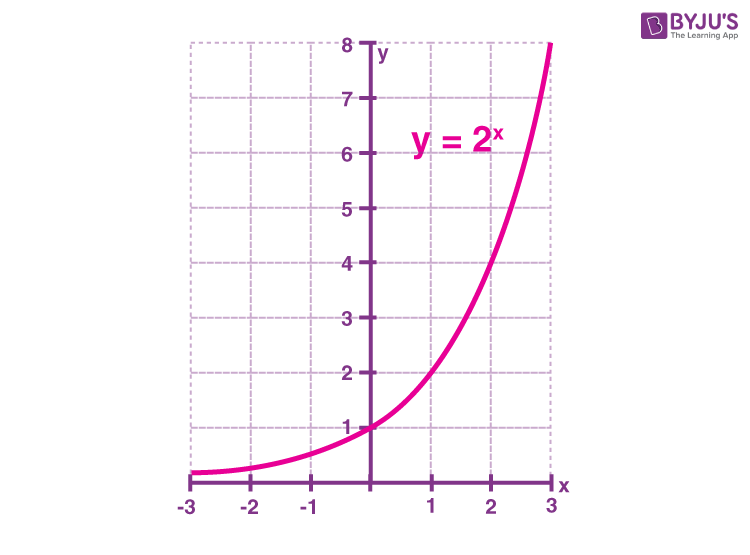


In [158]:
logits = x_enc @ W # this is matrix multiplication
counts = logits.exp()
# finding the probabilities
probs = counts/counts.sum(1,keepdim=True)
probs

tensor([[0.0874, 0.0126, 0.0043, 0.0549, 0.0313, 0.0182, 0.0109, 0.0098, 0.0533,
         0.0385, 0.0221, 0.0401, 0.0153, 0.0091, 0.0232, 0.0418, 0.0308, 0.0113,
         0.0071, 0.0186, 0.0638, 0.0044, 0.0706, 0.0655, 0.0327, 0.0036, 0.2188],
        [0.0060, 0.0325, 0.0056, 0.0216, 0.1000, 0.0112, 0.0185, 0.0113, 0.0156,
         0.0215, 0.0274, 0.0474, 0.0861, 0.0121, 0.0175, 0.0132, 0.0136, 0.0151,
         0.0473, 0.0113, 0.0751, 0.0092, 0.0251, 0.0178, 0.1097, 0.1828, 0.0456],
        [0.0410, 0.0300, 0.0131, 0.0445, 0.0397, 0.0356, 0.0031, 0.0077, 0.0195,
         0.0897, 0.0114, 0.0526, 0.0073, 0.0363, 0.0793, 0.0260, 0.0049, 0.0635,
         0.0594, 0.0110, 0.0770, 0.0610, 0.0048, 0.0313, 0.1265, 0.0021, 0.0216],
        [0.0410, 0.0300, 0.0131, 0.0445, 0.0397, 0.0356, 0.0031, 0.0077, 0.0195,
         0.0897, 0.0114, 0.0526, 0.0073, 0.0363, 0.0793, 0.0260, 0.0049, 0.0635,
         0.0594, 0.0110, 0.0770, 0.0610, 0.0048, 0.0313, 0.1265, 0.0021, 0.0216],
        [0.0106, 0.0945,

### STEP 2.5: Putting everything together

In [171]:
learning_rate = 100.0
reg_lambda = 0.01

In [172]:
# Creating the dataset
xs = []
ys = []


for w in names:
    w_list = ['.']+list(w)+['.']
    for i,j in zip(w_list,w_list[1:]):
        idx_i = stoi[i]
        idx_j = stoi[j]
        xs.append(idx_i)
        ys.append(idx_j)

xs = torch.tensor(xs)
ys = torch.tensor(ys)

num = xs.nelement()
print(num)

# initialising network
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((27,27),generator = g,requires_grad = True)

236898


In [173]:
epoch = []
loss_hist = []

**Adding regularization**  
The equivalent of the smoothing that we performed on the bigram model is regularization for MLPs. Here we incentivize all the weights to be zero by adding a regularization loss

In [174]:
# gradient descent
for i in range(1000):
    # forward pass
    x_enc = one_hot(xs,num_classes=27).float()
    logits = x_enc @ W
    counts = logits.exp()
    probs = counts/counts.sum(1,keepdims=True)

    # Here we are only calculating loss for correct pairs of outputs
    loss = -probs[torch.arange(num),ys].log().mean() + reg_lambda * (W**2).mean() 
    # the second term in the above equation is called a regularization term and is used to avoid large values of W
    epoch.append(i)
    loss_hist.append(loss.item())
    print(loss.item())

    #Backward pass
    W.grad = None # more efficient than setting to zero
    loss.backward()

    # update
    W.data += -learning_rate * W.grad

3.7693803310394287
3.140604019165039


2.925037145614624
2.811216115951538
2.7452926635742188
2.6990773677825928
2.667677879333496
2.644120693206787
2.636821746826172
2.6229798793792725
2.632599353790283
2.5972812175750732
2.5886900424957275
2.583570957183838
2.598897695541382
2.569087266921997
2.5654795169830322
2.562821865081787
2.580610752105713
2.552793264389038
2.551431655883789
2.550287961959839
2.5694644451141357
2.542513132095337
2.5422415733337402
2.5420968532562256
2.562143087387085
2.5356130599975586
2.535897970199585
2.536407947540283
2.557027578353882
2.5307352542877197
2.5313315391540527
2.53226375579834
2.553272008895874
2.52713680267334
2.527928352355957
2.529135227203369
2.550412654876709
2.5243914127349854
2.525319814682007
2.5267105102539062
2.548178195953369
2.5222439765930176
2.523275852203369
2.524794340133667
2.546400547027588
2.520533323287964
2.521644353866577
2.5232555866241455
2.544965982437134
2.519150495529175
2.520324468612671
2.522005081176758
2.5437936782836914
2.5180184841156006
2.5192422866

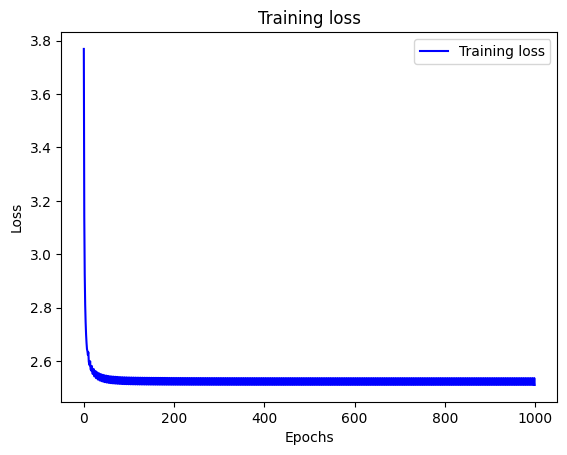

In [175]:
# Plotting the loss
plt.plot(epoch, loss_hist, 'b', label='Training loss')
plt.title('Training loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


### STEP 3: Generation

In [150]:
for i in range(1000):
    word_gen_list = []
    curr_idx = 0
    while True:
        curr_enc = one_hot(torch.tensor([curr_idx]),num_classes=27).float()
        # we essentially just choosing the row relevant to this prev char
        P = curr_enc @ W
        P = P.exp()
        P /= P.sum(1,keepdim=True)


        # Generating the next letter
        curr_idx = torch.multinomial(P,1,replacement=True,generator=g).item()
        if curr_idx == 0:
            break
        word_gen_list.append(itos[curr_idx])
    print(''.join(word_gen_list))


morvann
akela
az
arileri
chaiadayra
fbalodouseyton
za
sabran
han
ke
etamete
conakin
lalastan
tcyonanisemyn
lewesxin
kadarekan
ljagkin
muian
kicnaylula
jvy
b
dyn
hmay
semiosienamou
m
n
kadicooror
amiqurimiadeyn
keika
viyn
tax
mandtittolausali
mhaheeekaza
koberile
raya
khin
h
ke
wchinna
elophileakan
hdaliniasdirarincs
conza
andoubon
ah
kwwi
evafr
lelke
lidadasizudenieee
kariomymprey
dh
c
s
fiker
es
ma
dikealacikelegankrane
ala
derahambenda
dalelennsah
alarynermiabr
sho
traelela
ixena
ek
maryeya
k
me
yt
n
kacamaeyqenesh
a
navan
sin
inyohasan
f
eyaa
ay
ylay
elavbronida
h
opayniella
e
kyahiistt
mayn
vetala
lltosratalitonyowarinen
kamalad
s
shosharbeviai
ssedrenn
qsi
ylizedam
fmise
kha
nusaredon
kisspizeevarsevitenozai
han
dyoworan
miesh
deiaitoinna
zylilliraan
hah
n
halariy
gvkiekhtaere
heloveriya
chnu
budhisia
ay
n
dfinnbrmutha
ickiyn
con
an
rahaumiylielyna
afi
r
ylupereexta
charali
nslenadar
r
aiandinene
th
kheikaison
aiatalzit
kenvevia
colvaderahuwiaee
ga
la
lielioleyn
mi
naylivahaioranl